In [1]:
import pickle
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow.keras as K
import tensorflow as tf
from src.models.train_model import train_svm
from src.models.detectors import Detector
from tqdm import tqdm
from copy import deepcopy
from src.data.dataset_loaders import DatasetLoader, AerialCarsDatasetLoader
from typing import Tuple
from src.features.pipelines import RawImageToFeatures
from src.features.processors import NormImage, Resize
from src.data.image_loaders import AerialCarsFixedSizeImageLoader
from src.models.classifiers import ResnetModelWrapper
from src.models.detectors import SliderDetector, SliderProbDetector
from src.data.sliders import SlidingWindow
from src.features.processors import RotateToHorizontal, Resize
from src.features.descriptors import HOGDescriptor, LBPDescriptor
import matplotlib.pyplot as plt
from src.models.classifiers import ProbSVMModelWrapper

## Aerial Cars Dataset

In [2]:
# DATA_PATH = '../../data/processed/aerial-cars-dataset/data.pickle'
DATA_PATH = '../../data/processed/aerial-cars-dataset/data_features_fixed_rotated.pickle'

In [3]:
with open(DATA_PATH, 'rb') as f:
    data = pickle.load(f)

### SVM training

In [4]:
model, report = train_svm(data, test_size=0.1, probability=True)

ValueError: setting an array element with a sequence.

In [5]:
print(report)

              precision    recall  f1-score   support

           0       1.00      0.99      1.00       128
           1       0.99      1.00      1.00       135

    accuracy                           1.00       263
   macro avg       1.00      1.00      1.00       263
weighted avg       1.00      1.00      1.00       263



In [6]:
classes0 = [x[2] for x in data if x[2] == 0]
img0 = [x[0] for x in data if x[2] == 0]
classes1 = [x[2] for x in data if x[2] == 1]
img1 = [x[0] for x in data if x[2] == 1]

In [7]:
len(classes0)

1312

In [8]:
len(classes1)

1312

### Validation

In [9]:
def validate_model(
    dataset_loader: DatasetLoader,
    input_folder_filepath: str,
    images_files_types: Tuple[str],
    annotations_files_types: Tuple[str],
    detector: Detector,
    workers: int = 0
):

    images = dataset_loader.load_dataset(
        input_folder_filepath,
        images_files_types,
        annotations_files_types,
        False
    )

    processed_images = []

    for image in tqdm(images):
        processed_images.append(
            detector(deepcopy(image), workers)
        )

    return processed_images

In [10]:
# class ModelWrapper:

#     def __init__(self, model):
#         self.model = model

#     def predict(self, x):
#         return self.model.predict(x)

In [14]:
BND_BOX_SIZE = (80, 80)

dataset_loader = AerialCarsDatasetLoader(
    image_loader=AerialCarsFixedSizeImageLoader(
        bnd_box_size=BND_BOX_SIZE
    )
)

process_pipeline = RawImageToFeatures(
    processors=[
        # RotateToHorizontal(),
        # Resize(
        #     output_size=(64, 64)
        # )
    ],
    descriptors=[
        HOGDescriptor(
            orientations = 9,
            cells_per_block = (2, 2),
            pixels_per_cell = (4, 4),
            multichannel = True,
            visualize = True
        ),
        LBPDescriptor(
            bins = 256,
            range = (0, 256)
        )
    ]
)

sliding_window = SlidingWindow(
    step_size=20,
    window_size=BND_BOX_SIZE
)

slider_detector = SliderProbDetector(
    sliding_window=sliding_window,
    process_pipeline=process_pipeline,
    classifier=ProbSVMModelWrapper(model),
    treshold=0.8,
    nms_overlap=0.4
)

In [15]:
processed_images = validate_model(
    dataset_loader=dataset_loader,
    input_folder_filepath='../../data/raw/aerial-cars-dataset/val',
    images_files_types=('jpg', 'JPG', 'png'),
    annotations_files_types=('txt',),
    detector=slider_detector,
    workers=7
)

  0%|          | 0/5 [00:00<?, ?it/s]Process ForkPoolWorker-14:
Process ForkPoolWorker-8:
Process ForkPoolWorker-9:
Process ForkPoolWorker-13:
Traceback (most recent call last):
Process ForkPoolWorker-11:
Process ForkPoolWorker-12:
Process ForkPoolWorker-10:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/lib/python3.8/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/usr/lib/python3.8/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/usr/lib/python3.8/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/usr/lib/python3.8/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/usr/lib/python3.8/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.8/multiprocessing/process.py", line 108, in run
    self._target(*self._args,

KeyboardInterrupt: 

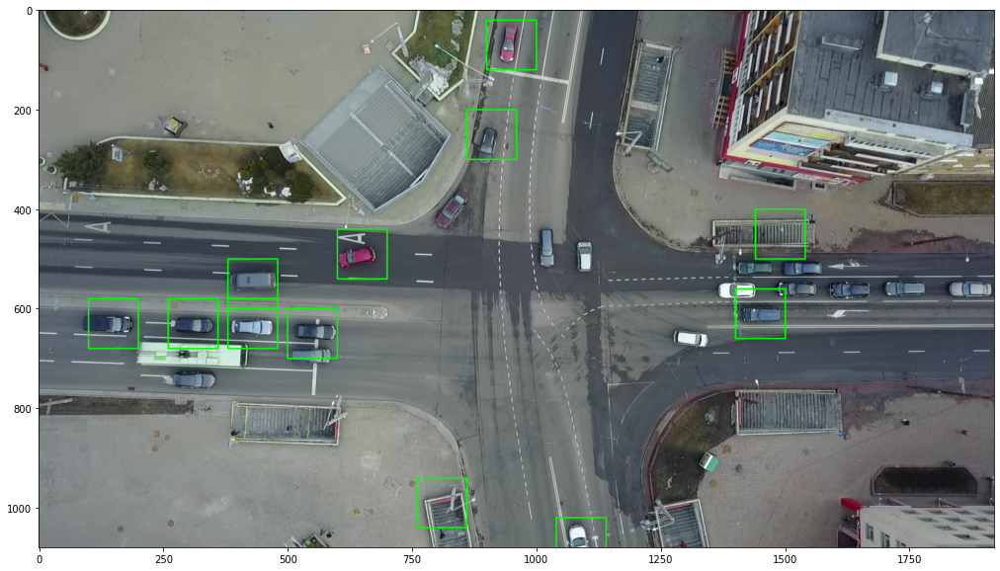

In [38]:
plt.figure(figsize=(20,10))
plt.imshow(processed_images[0][0])

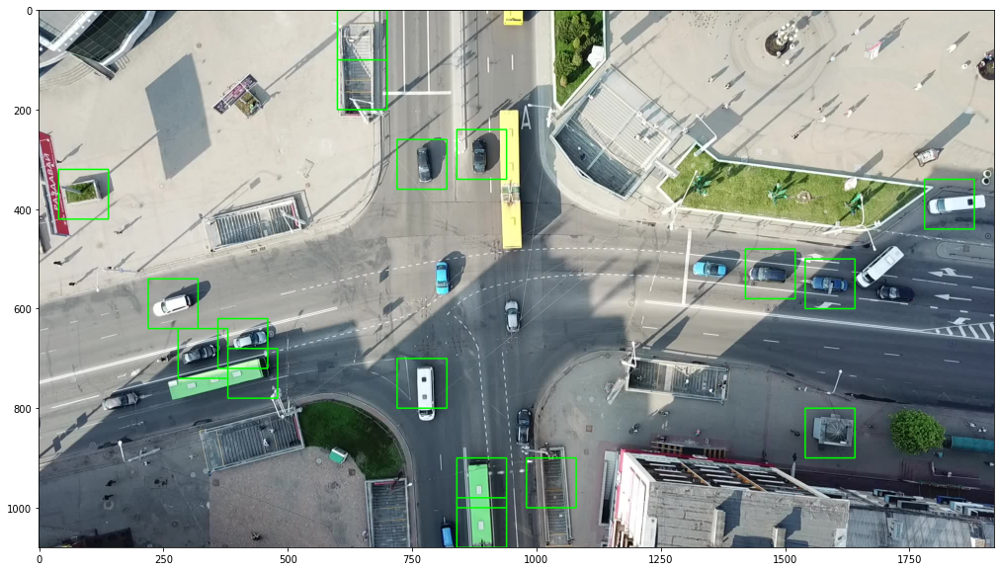

In [39]:
plt.figure(figsize=(20,10))
plt.imshow(processed_images[1][0])

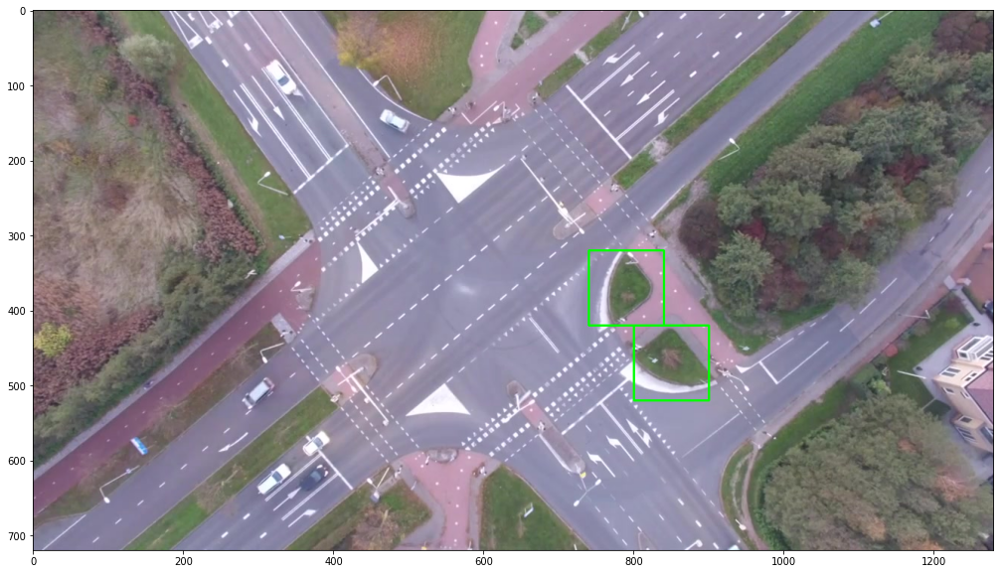

In [40]:
plt.figure(figsize=(20,10))
plt.imshow(processed_images[2][0])

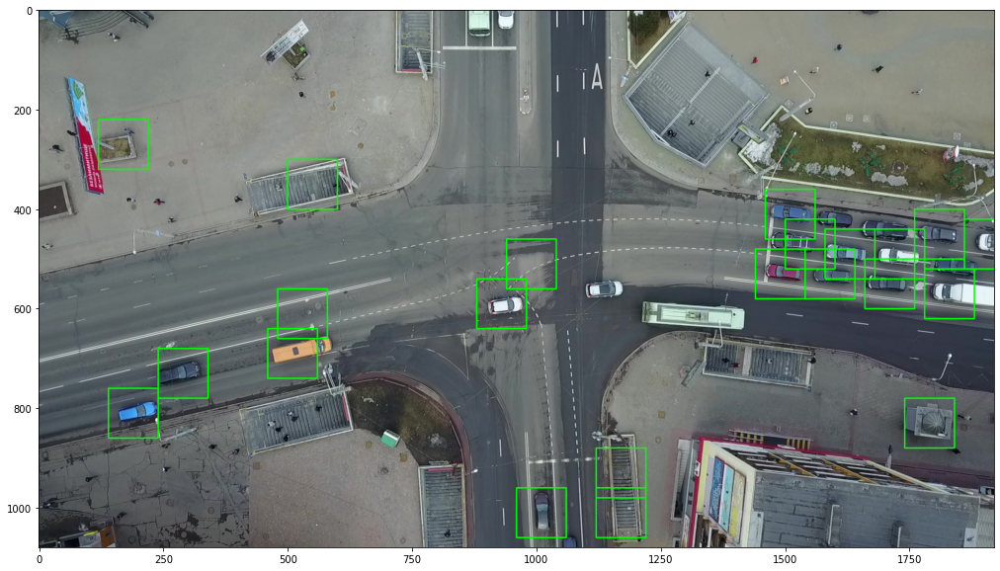

In [41]:
plt.figure(figsize=(20,10))
plt.imshow(processed_images[3][0])

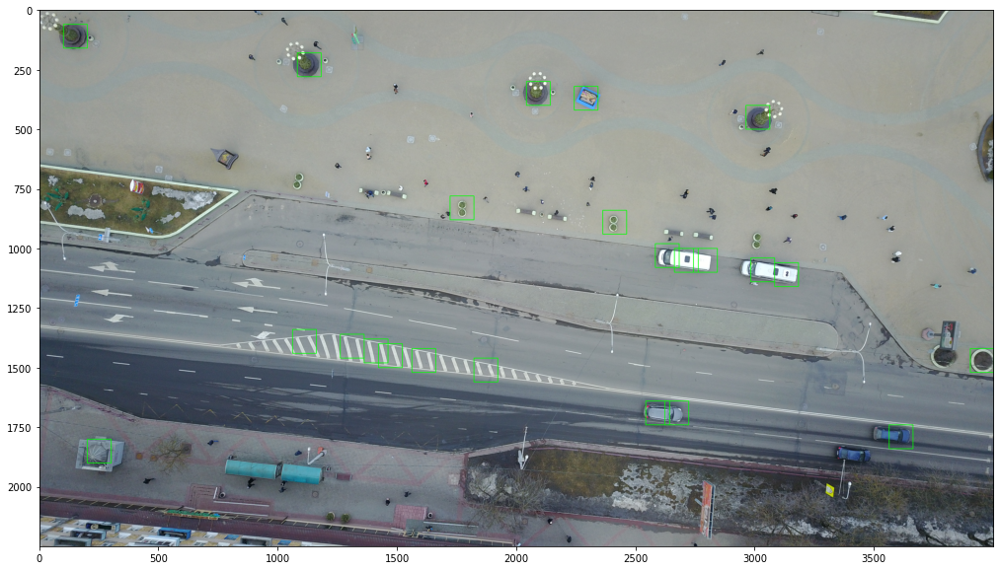

In [42]:
plt.figure(figsize=(20,10))
plt.imshow(processed_images[4][0])